In [1]:
# this is a list of packages that are used in this notebook
# these come with python
import io
import zipfile
import functools
import bisect
import datetime
import pathlib



# you can install these packages using pip or anaconda
# (requests numpy pandas bokeh pyproj statsmodels)

# for downloading
import requests
import netCDF4

# computation libraries
import numpy as np
import pandas as pd


import pandas as pd

# coordinate systems
import pyproj 

# statistics
import statsmodels.api as sm
import statsmodels.multivariate.pca
import statsmodels.tsa.seasonal


# plotting
import bokeh.io
import bokeh.plotting
import bokeh.tile_providers
import bokeh.palettes

import windrose
import matplotlib.colors
import matplotlib.cm
import matplotlib.pyplot as plt
matplotlib.projections.register_projection(windrose.WindroseAxes)
import cmocean.cm
import colorcet
import datashader
import datashader.transfer_functions as tf
from datashader.bokeh_ext import InteractiveImage
from bokeh.plotting import figure, show, output_file



# displaying things
from ipywidgets import Image
import IPython.display

/Users/baart_f/.virtualenvs/main/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools
/Users/baart_f/.virtualenvs/main/lib/python3.6/site-packages/cmocean/tools.py:76: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not mpl.cbook.is_string_like(rgbin[0]):


# Tide gauges
This notebook analyzes plots the history of tide gauge data available from PSMSL

In [2]:
psmsl_urls = {
    'met_monthly': 'http://www.psmsl.org/data/obtaining/met.monthly.data/met_monthly.zip',
    'rlr_monthly': 'http://www.psmsl.org/data/obtaining/rlr.monthly.data/rlr_monthly.zip',
    'rlr_annual': 'http://www.psmsl.org/data/obtaining/rlr.annual.data/rlr_annual.zip'
}
psmsl_files = {
    'met_monthly': pathlib.Path('~/src/sealevel/data/psmsl/met_monthly.zip').expanduser(),
    'rlr_monthly': pathlib.Path('~/src/sealevel/data/psmsl/rlr_monthly.zip').expanduser(),
    'rlr_annual': pathlib.Path('~/src/sealevel/data/psmsl/rlr_annual.zip').expanduser()   
}
default_dataset_name = 'rlr_annual'

In [3]:
# open the zipfile
zipfiles = {}

# store reference to zip files, just keep them open
for dataset_name in psmsl_files:
    stream = open(psmsl_files[dataset_name], 'rb')
    zf = zipfile.ZipFile(stream)
    zipfiles[dataset_name] = zf

# this list contains a table of 
# station ID, latitude, longitude, station name, coastline code, station code, and quality flag
csvtext = zipfiles[dataset_name].read('{}/filelist.txt'.format(dataset_name))
# read all the data
stations = pd.read_csv(
    io.BytesIO(csvtext), 
    sep=';',
    names=('id', 'lat', 'lon', 'name', 'coastline_code', 'station_code', 'quality'),
    converters={
        'name': str.strip,
        'quality': str.strip
    }
)
stations = stations.set_index('id')


In [4]:
# all relevant urls
names = {
    'datum': '{dataset_name}/RLR_info/{id}.txt',
    'diagram': '{dataset_name}/RLR_info/{id}.png',
    'url': 'http://www.psmsl.org/data/obtaining/rlr.diagrams/{id}.php',
    'rlr_monthly': '{dataset_name}/data/{id}.rlrdata',
    'rlr_annual': '{dataset_name}/data/{id}.rlrdata',
    'met_monthly': '{dataset_name}/data/{id}.metdata',
    'doc': '{dataset_name}/docu/{id}.txt',
    'contact': '{dataset_name}/docu/{id}_auth.txt'
}

In [5]:
# add urls to the dataset
def get_url(station, dataset_name):
    """return the url of the station information (diagram and datum)"""
    info = dict(
        dataset_name=dataset_name,
        id=station.name
    )
    url = names['url'].format(**info)
    return url

for dataset_name in psmsl_urls:
    # fill in the dataset parameter using the global dataset_name
    f = functools.partial(get_url, dataset_name=dataset_name)
    # compute the url for each station
    stations[dataset_name] = stations.apply(f, axis=1)
stations.head()

,lat,lon,name,coastline_code,station_code,quality,met_monthly,rlr_monthly,rlr_annual
id,,,,,,,,,
1,48.382850,-4.494838,BREST,190,91,N,http://www.psmsl.org/data/obtaining/rlr.diagra...,http://www.psmsl.org/data/obtaining/rlr.diagra...,http://www.psmsl.org/data/obtaining/rlr.diagra...
2,53.916667,14.233333,SWINOUJSCIE,110,92,N,http://www.psmsl.org/data/obtaining/rlr.diagra...,http://www.psmsl.org/data/obtaining/rlr.diagra...,http://www.psmsl.org/data/obtaining/rlr.diagra...
3,51.445639,0.743444,SHEERNESS,170,101,N,http://www.psmsl.org/data/obtaining/rlr.diagra...,http://www.psmsl.org/data/obtaining/rlr.diagra...,http://www.psmsl.org/data/obtaining/rlr.diagra...
5,53.313944,-4.620444,HOLYHEAD,170,191,Y,http://www.psmsl.org/data/obtaining/rlr.diagra...,http://www.psmsl.org/data/obtaining/rlr.diagra...,http://www.psmsl.org/data/obtaining/rlr.diagra...
7,53.866667,8.716667,CUXHAVEN 2,140,12,N,http://www.psmsl.org/data/obtaining/rlr.diagra...,http://www.psmsl.org/data/obtaining/rlr.diagra...,http://www.psmsl.org/data/obtaining/rlr.diagra...


In [6]:
# use nans for missing, a bit more performant than masked arrays
def missing2nan(value, missing=-99999):
    """convert the value to nan if the float of value equals the missing value"""
    value = float(value)
    if value == missing:
        return np.nan
    return value

def year2date(year_fraction, dtype='datetime64[s]'):
    """convert a fraction of a year + fraction of a year to a date, for example 1993.12 -> 1993-02-01.
    The dtype should be a valid numpy datetime unit, such as datetime64[s]"""
    startpoints = np.linspace(0, 1, num=12, endpoint=False)
    remainder = np.mod(year_fraction, 1)
    year = np.floor_divide(year_fraction, 1).astype('int')
    month = np.searchsorted(startpoints, remainder)
    if (month == 0).all():
        # if month is set to 0 (for annual data), set to january
        month = np.ones_like(month)
    dates = [
        datetime.datetime(year_i, month_i, 1) 
        for year_i, month_i 
        in zip(year, month)
    ]
    datetime64s = np.asarray(dates, dtype=dtype)
    return datetime64s

def get_data(station, dataset_name):
    """get data for the station (pandas record) from the dataset (url)"""
    info = dict(
        dataset_name=dataset_name,
        id=station.name
    )
    bytes = zipfiles[dataset_name].read(names[dataset_name].format(**info))
    df = pd.read_csv(
        io.BytesIO(bytes), 
        sep=';', 
        names=('year', 'height', 'interpolated', 'flags'),
        converters={
            "height": lambda x: missing2nan(x),
            "interpolated": str.strip,
        }
    )
    df['station'] = station.name
    df['t'] = year2date(df.year)
    df = df.set_index('t')
    return df

In [7]:
# get data for all stations
for dataset_name in psmsl_urls:
    f = functools.partial(get_data, dataset_name=dataset_name)
    # look up the data for each station
    stations[dataset_name] = [f(station) for _, station in stations.iterrows()]

In [8]:
# Create an interactive chart for inspection
TOOLTIPS=[
    ("Name", "$name"),
    ("SLR", "@y")
]

p = figure(
    title="trends", 
    x_axis_type="datetime",
    plot_width=900, 
    plot_height=400,
    y_range=(-20, 20),
    tooltips=TOOLTIPS
)

for i, station in stations.iterrows():
    if station.lat > 90:
        continue
    color = cmocean.cm.delta((station.lat + 90)/180, bytes=True)
    series = station.rlr_annual.height.rolling(window=30).mean().diff()
    p.line(series.index, series, name=station['name'], line_alpha=0.1, line_color=color[:3])



bokeh.io.output_notebook()
show(p)

Loading BokehJS ...

In [9]:
# reshape the data for datashader
series_list = [
    station.dropna()['height']
    for station 
    in stations['rlr_annual'].tolist()   
]
raw_merged = pd.concat(series_list, axis=1)


series_list = [
    station.dropna()['height'].rolling(window=30).mean()
    for station 
    in stations['rlr_annual'].tolist()   
]
smoothed_merged = pd.concat(series_list, axis=1)


series_list = [
    station.dropna()['height'].rolling(window=30).mean().diff()
    for station 
    in stations['rlr_annual'].tolist()   
]
trends_merged = pd.concat(series_list, axis=1)


# pivot (series split by nans)
raw_pivotted = datashader.utils.dataframe_from_multiple_sequences(
    np.array([x.year for x in raw_merged.index]), 
    raw_merged.values.T
)
smoothed_pivotted = datashader.utils.dataframe_from_multiple_sequences(
    np.array([x.year for x in smoothed_merged.index]), 
    smoothed_merged.values.T
)
trends_pivotted = datashader.utils.dataframe_from_multiple_sequences(
    np.array([x.year for x in trends_merged.index]), 
    trends_merged.values.T
)


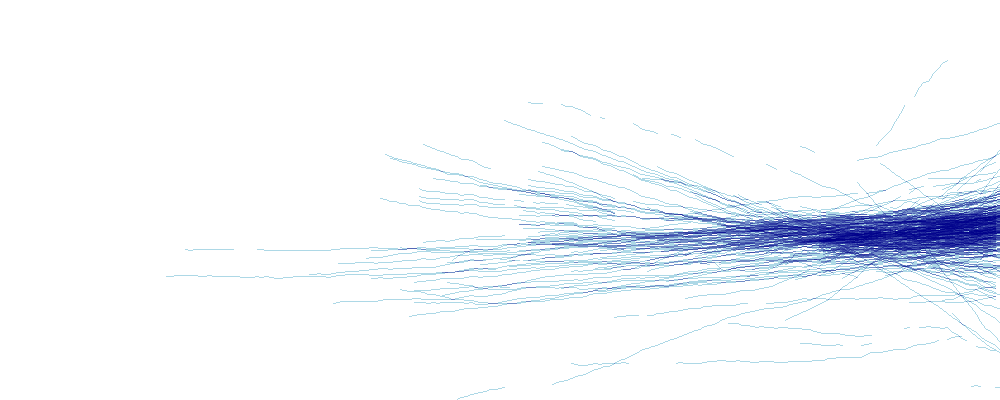

In [10]:
# plot all the data
canvas = datashader.Canvas(plot_width=800, plot_height=400)
cvs = datashader.Canvas(plot_height=400, plot_width=1000)
agg = cvs.line(smoothed_pivotted, 'x', 'y', datashader.count())   
img = tf.shade(agg, how='eq_hist')
img

In [13]:

def base_plot(tools='pan,wheel_zoom,reset,save'):
    p = figure(
        tools=tools, 
        plot_width=900, 
        plot_height=400,
        x_range=[
            trends_merged.index[0].year, 
            trends_merged.index[-1].year
        ], 
        y_range=[np.nanmin(trends_merged.values), np.nanmax(trends_merged.values)], 
        outline_line_color=None,
        min_border=0, 
        min_border_left=0, 
        min_border_right=0,
        min_border_top=0, 
        min_border_bottom=0,
        title='Sea-level trends, based on 30 year moving window in {} tide gauges'.format(stations.shape[0])
    )
    p.yaxis.axis_label = "Sea-level rise [mm/yr]"
    p.xaxis.axis_label = "Time"
    p.add_tools(bokeh.models.BoxZoomTool(match_aspect=False))
    return p

def create_image(x_range, y_range, w, h):
    cvs = datashader.Canvas(x_range=x_range, y_range=y_range, plot_height=800, plot_width=1800)
    agg = cvs.line(trends_pivotted, 'x', 'y', datashader.count())

    img = tf.set_background(tf.shade(agg, how='eq_hist', cmap=colorcet.fire), 'black')
    return tf.dynspread(img)

plt = base_plot()
InteractiveImage(plt, create_image)